<a href="https://colab.research.google.com/github/HarshithaM39/Harshitha/blob/main/brain_tumor_object_detectionwatershedyolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importing Libraries

In [ ]:
!pip install Augmentor
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 58.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import cv2
import math
import os
import zipfile
import random
import shutil
import Augmentor
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
from PIL import Image
from IPython.display import display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## EDA

In [ ]:


!pip install /content/drive/MyDrive/colab_libs --force-reinstall


ERROR: Directory '/content/drive/MyDrive/colab_libs' is not installable. Neither 'setup.py' nor 'pyproject.toml' found.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
zip_path = '/content/drive/MyDrive/archive (2).zip'
extract_path = '/content/drive/MyDrive/brain_tumor_object_detection/data'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/archive (2).zip'

In [ ]:
sample_image.size

(512, 512)

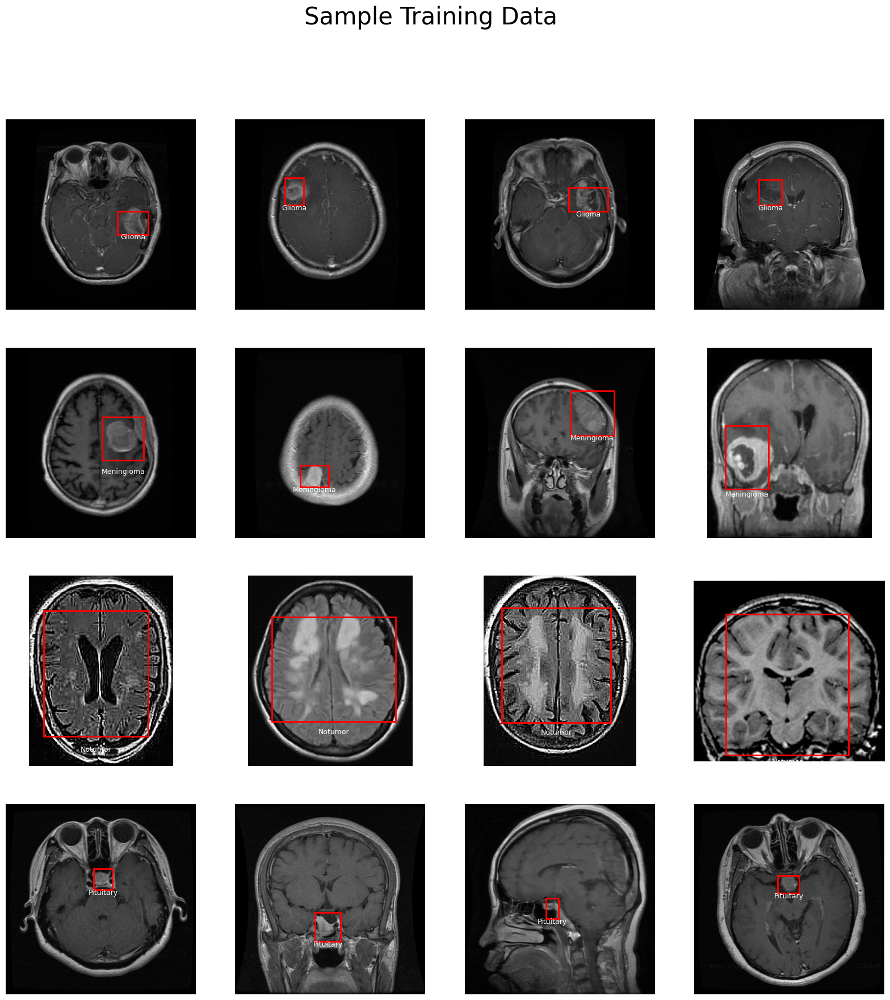

In [ ]:
# Plotting the training data with bounding boxes
dataset_directory = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/train'
class_labels = {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

fig, axes = plt.subplots(4, 4, figsize=(20, 20))

for class_name, ax_row in zip(class_labels.keys(), axes):
    class_directory = os.path.join(dataset_directory, class_name)
    image_files = [f for f in os.listdir(class_directory) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, 4)

    for ax, image_file in zip(ax_row, selected_images):
        annotation_file = os.path.join(class_directory, image_file.replace('.jpg', '.txt'))
        with open(annotation_file, 'r') as file:
            line = file.readline().strip().split()
            class_number, centre_x, centre_y, height, width = map(float, line)

        img = plt.imread(os.path.join(class_directory, image_file))

        if len(img.shape) == 2:
            img = np.stack((img,) * 3, axis=-1)

        img_height, img_width, _ = img.shape
        x_min = (centre_x - width / 2) * img_width
        y_min = (centre_y - height / 2) * img_height
        x_max = (centre_x + width / 2) * img_width
        y_max = (centre_y + height / 2) * img_height
        tumor_bbox = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none', label=f'{class_name.capitalize()}')
        ax.imshow(img)
        ax.add_patch(tumor_bbox)

        label_text = f'{class_name.capitalize()}'
        ax.text((x_min + x_max) / 2, y_max + 18, label_text, color='w', ha='center', va='bottom', fontsize=9)

for ax_row in axes:
    for ax in ax_row:
        ax.axis('off')

plt.suptitle("Sample Training Data", fontsize=30)
plt.show()

In [ ]:
import cv2
import os
import shutil
from glob import glob

def apply_gaussian_blur(input_dir, output_dir, kernel_size=(5, 5), sigmaX=0):
    """
    Apply Gaussian blur to all images in a directory and save them to a new directory.
    """
    os.makedirs(output_dir, exist_ok=True)

    # Copy annotations
    annotation_files = glob(os.path.join(input_dir, "*.txt"))
    for annotation_file in annotation_files:
        shutil.copy(annotation_file, output_dir)

    # Process images
    image_files = glob(os.path.join(input_dir, "*.jpg"))
    for img_path in image_files:
        img = cv2.imread(img_path)
        blurred_img = cv2.GaussianBlur(img, kernel_size, sigmaX)

        output_path = os.path.join(output_dir, os.path.basename(img_path))
        cv2.imwrite(output_path, blurred_img)

# Paths
dataset_directory = "/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/"
train_input_dir = os.path.join(dataset_directory, "train")
test_input_dir = os.path.join(dataset_directory, "test")

blurred_train_dir = os.path.join(dataset_directory, "train_blurred")
blurred_test_dir = os.path.join(dataset_directory, "test_blurred")

# Apply Gaussian Blur to Train & Test Data
apply_gaussian_blur(train_input_dir, blurred_train_dir)
apply_gaussian_blur(test_input_dir, blurred_test_dir)

print("✅ Gaussian Blurring Applied to Dataset")


✅ Gaussian Blurring Applied to Dataset


## Train-Test Split

In [ ]:
def custom_train_test_split(dataset_directory, test_ratio=0.2, random_seed=None, min_samples_per_class=2):
    """
    Custom function to perform a stratified train-test split on an image dataset.
    This function organizes the dataset into 'train' and 'test' directories while maintaining the class-wise distribution.
    It creates the 'train' and 'test' directories within the given dataset directory and moves images accordingly.
    """
    random_seed = random_seed or 42

    class_directories = [d for d in os.listdir(dataset_directory) if os.path.isdir(os.path.join(dataset_directory, d))]

    train_directory = os.path.join(dataset_directory, 'train')
    test_directory = os.path.join(dataset_directory, 'test')
    os.makedirs(train_directory, exist_ok=True)
    os.makedirs(test_directory, exist_ok=True)

    for class_dir in class_directories:
        class_path = os.path.join(dataset_directory, class_dir)

        image_files = [f for f in os.listdir(class_path) if f.endswith('.jpg')]

        if len(image_files) < min_samples_per_class:
            continue

        train_images, test_images = train_test_split(image_files, test_size=test_ratio, random_state=random_seed)

        for train_image in train_images:
            src_image_path = os.path.join(class_path, train_image)
            src_annotation_path = os.path.join(class_path, train_image.replace('.jpg', '.txt'))

            dest_image_path = os.path.join(train_directory, class_dir, train_image)
            dest_annotation_path = os.path.join(train_directory, class_dir, train_image.replace('.jpg', '.txt'))

            os.makedirs(os.path.dirname(dest_image_path), exist_ok=True)

            if os.path.exists(src_annotation_path):
                shutil.move(src_image_path, dest_image_path)
                shutil.move(src_annotation_path, dest_annotation_path)

        for test_image in test_images:
            src_image_path = os.path.join(class_path, test_image)
            src_annotation_path = os.path.join(class_path, test_image.replace('.jpg', '.txt'))

            dest_image_path = os.path.join(test_directory, class_dir, test_image)
            dest_annotation_path = os.path.join(test_directory, class_dir, test_image.replace('.jpg', '.txt'))

            os.makedirs(os.path.dirname(dest_image_path), exist_ok=True)

            if os.path.exists(src_annotation_path):
                shutil.move(src_image_path, dest_image_path)
                shutil.move(src_annotation_path, dest_annotation_path)

In [ ]:
dataset_directory ='/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset'
custom_train_test_split(dataset_directory, test_ratio=0.2, random_seed=42, min_samples_per_class=2)

In [ ]:
def count_images_per_class(directory):
    class_counts = {}
    for class_dir in os.listdir(directory):
        class_path = os.path.join(directory, class_dir)
        if os.path.isdir(class_path):
            class_counts[class_dir] = len([f for f in os.listdir(class_path) if f.endswith('.jpg')])
    return class_counts

In [ ]:
def plot_image_counts(train_directory, test_directory):
    """
    Plot the number of images in each class for both the training and testing sets.
    This function counts the number of images in each class for both the training and testing sets
    and plots a bar chart to visualize the distribution.
    """
    train_counts = count_images_per_class(train_directory)
    test_counts = count_images_per_class(test_directory)

    class_names = list(train_counts.keys())
    train_counts_values = list(train_counts.values())
    test_counts_values = [test_counts[class_name] for class_name in class_names]

    bar_width = 0.35
    index = range(len(class_names))

    fig, ax = plt.subplots()
    bar1 = ax.bar(index, train_counts_values, bar_width, label='Train')
    bar2 = ax.bar([i + bar_width for i in index], test_counts_values, bar_width, label='Test')

    ax.set_xlabel('Class')
    ax.set_ylabel('Number of Images')
    ax.set_title('Number of Images in Each Class for Train and Test Sets')
    ax.set_xticks([i + bar_width/2 for i in index])
    ax.set_xticklabels(class_names)
    ax.legend()

    plt.show()

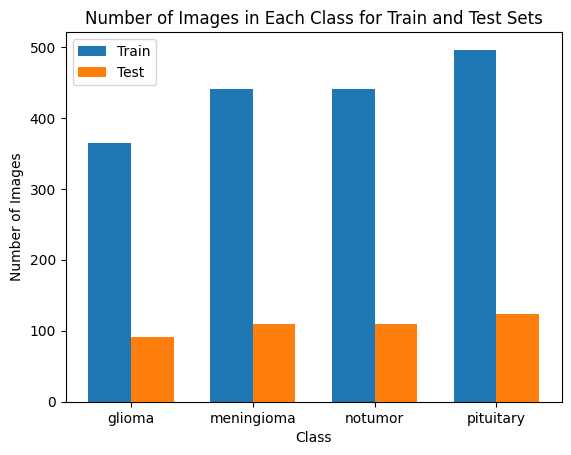

In [ ]:
dataset_directory = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/'
train_directory = os.path.join(dataset_directory, 'train')
test_directory = os.path.join(dataset_directory, 'test')

plot_image_counts(train_directory, test_directory)

In [ ]:
yolov8m_btd_model_adamax = YOLO('yolov8m.yaml')
yolov8m_btd_model_adamax_results = yolov8m_btd_model_adamax.train(data = '/content/drive/MyDrive/brain_tumor_dataset.yaml',
                                                    epochs = 30,
                                                    batch = 32,
                                                    name = 'YOLOv8m_Adamax',
                                                    optimizer = 'Adamax',
                                                    lr0 = 0.001,
                                                    lrf = 0.001,
                                                    momentum = 0.89,
                                                    dropout = 0.4
                                                    )

New https://pypi.org/project/ultralytics/8.3.80 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.79 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/drive/MyDrive/brain_tumor_dataset.yaml, epochs=30, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv8m_Adamax, exist_ok=False, pretrained=True, optimizer=Adamax, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.4, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, em

100%|██████████| 755k/755k [00:00<00:00, 8.97MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 188MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/train/glioma.cache... 1740 images, 2 backgrounds, 0 corrupt: 100%|██████████| 1740/1740 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma.cache... 435 images, 0 backgrounds, 0 corrupt: 100%|██████████| 435/435 [00:00<?, ?it/s]


Plotting labels to runs/detect/YOLOv8m_Adamax/labels.jpg... 
optimizer: Adamax(lr=0.001, momentum=0.89) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/YOLOv8m_Adamax
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      12.6G      3.341      4.518      3.578         20        640: 100%|██████████| 55/55 [05:44<00:00,  6.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [01:17<00:00, 11.03s/it]


                   all        435        439   0.000444      0.236    0.00122   0.000517

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      12.6G      2.943      3.471      3.058         28        640: 100%|██████████| 55/55 [00:55<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.06s/it]

                   all        435        439    0.00813      0.245     0.0174     0.0052



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      12.2G      2.456      2.659       2.73         19        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

                   all        435        439       0.44      0.252      0.145     0.0559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      12.5G      2.184      2.273      2.523         18        640: 100%|██████████| 55/55 [00:55<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.06it/s]

                   all        435        439      0.754      0.432      0.517       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      12.2G       1.98      1.963      2.296         26        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.03s/it]

                   all        435        439      0.544       0.61      0.623      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      12.6G      1.872      1.809      2.204         15        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.06s/it]

                   all        435        439      0.681      0.531      0.637      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      12.2G      1.835      1.667      2.134         19        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.06s/it]

                   all        435        439      0.621      0.643      0.683      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      12.5G      1.787      1.615      2.072         20        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.10s/it]

                   all        435        439      0.729      0.618      0.719      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      12.2G       1.68       1.45      1.987         20        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

                   all        435        439      0.706      0.687      0.747      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      12.5G      1.679      1.445      1.969         23        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

                   all        435        439      0.714      0.663      0.768      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      12.2G      1.672      1.411      1.962         22        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

                   all        435        439       0.77      0.666      0.741      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      12.5G      1.613      1.339      1.922         21        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.06s/it]

                   all        435        439      0.756      0.747      0.805       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      12.2G      1.631      1.339      1.927         21        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]

                   all        435        439      0.849      0.742      0.827       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      12.5G       1.59      1.284      1.886         19        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.00s/it]

                   all        435        439      0.778      0.775      0.828      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      12.2G      1.557      1.263      1.864         17        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.01s/it]

                   all        435        439      0.791      0.763      0.813      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      12.5G      1.536      1.183      1.826         21        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.04s/it]

                   all        435        439      0.808      0.778      0.822      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      12.2G      1.501      1.146        1.8         25        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.09it/s]

                   all        435        439      0.792      0.782      0.822      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      12.5G      1.509      1.149      1.801         26        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.01s/it]

                   all        435        439      0.802      0.774      0.834      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      12.2G      1.482      1.112      1.773         17        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.06s/it]

                   all        435        439      0.822      0.794      0.854      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      12.5G       1.48      1.103      1.758         22        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

                   all        435        439      0.845      0.796      0.865      0.505


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      12.2G      1.469      1.031      1.857         13        640: 100%|██████████| 55/55 [00:57<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.10it/s]

                   all        435        439      0.857      0.771      0.851      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      12.5G      1.448     0.9977      1.831         13        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.04it/s]

                   all        435        439      0.851      0.771      0.858      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      12.2G      1.412     0.9693      1.808         12        640: 100%|██████████| 55/55 [00:55<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.02it/s]

                   all        435        439      0.911       0.82      0.894       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      12.5G      1.388     0.9052      1.797         14        640: 100%|██████████| 55/55 [00:55<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.05it/s]

                   all        435        439      0.874      0.816      0.897      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      12.2G      1.382     0.8625      1.779         12        640: 100%|██████████| 55/55 [00:55<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.04s/it]

                   all        435        439      0.835      0.842      0.887      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      12.6G      1.354     0.8726      1.759         12        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.07s/it]

                   all        435        439      0.861      0.836      0.906      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      12.2G      1.325     0.8262      1.731         12        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.08s/it]

                   all        435        439      0.874      0.858      0.902      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      12.5G      1.313     0.8067      1.723         12        640: 100%|██████████| 55/55 [00:56<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.11s/it]

                   all        435        439      0.884      0.856      0.915      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      12.2G      1.286     0.7792       1.69         12        640: 100%|██████████| 55/55 [00:56<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.03s/it]

                   all        435        439      0.917      0.834      0.918      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      12.5G      1.267     0.7587      1.683         12        640: 100%|██████████| 55/55 [00:55<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.01it/s]

                   all        435        439      0.903      0.833      0.916      0.549



30 epochs completed in 0.678 hours.
Optimizer stripped from runs/detect/YOLOv8m_Adamax/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/YOLOv8m_Adamax/weights/best.pt, 52.0MB

Validating runs/detect/YOLOv8m_Adamax/weights/best.pt...
Ultralytics 8.3.79 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.68s/it]


                   all        435        439      0.903      0.833      0.916      0.548
                glioma        124        125      0.928      0.925       0.96      0.478
            meningioma        110        110       0.94      0.927      0.984      0.607
               notumor         91         94       0.82      0.574      0.747      0.371
             pituitary        110        110      0.926      0.906      0.974      0.737
Speed: 0.2ms preprocess, 10.0ms inference, 0.0ms loss, 6.0ms postprocess per image
Results saved to runs/detect/YOLOv8m_Adamax


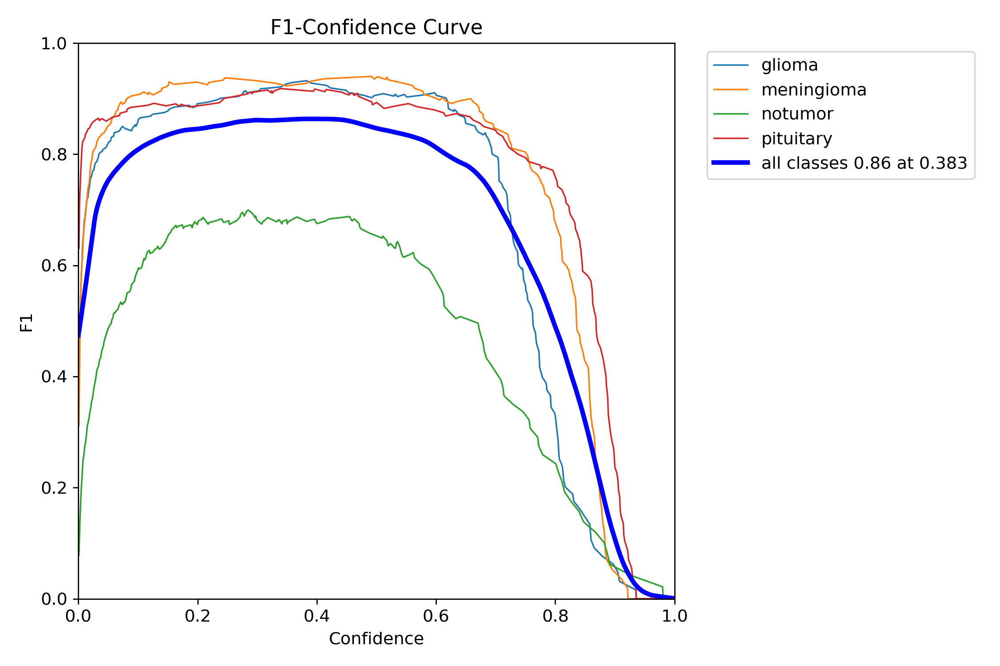

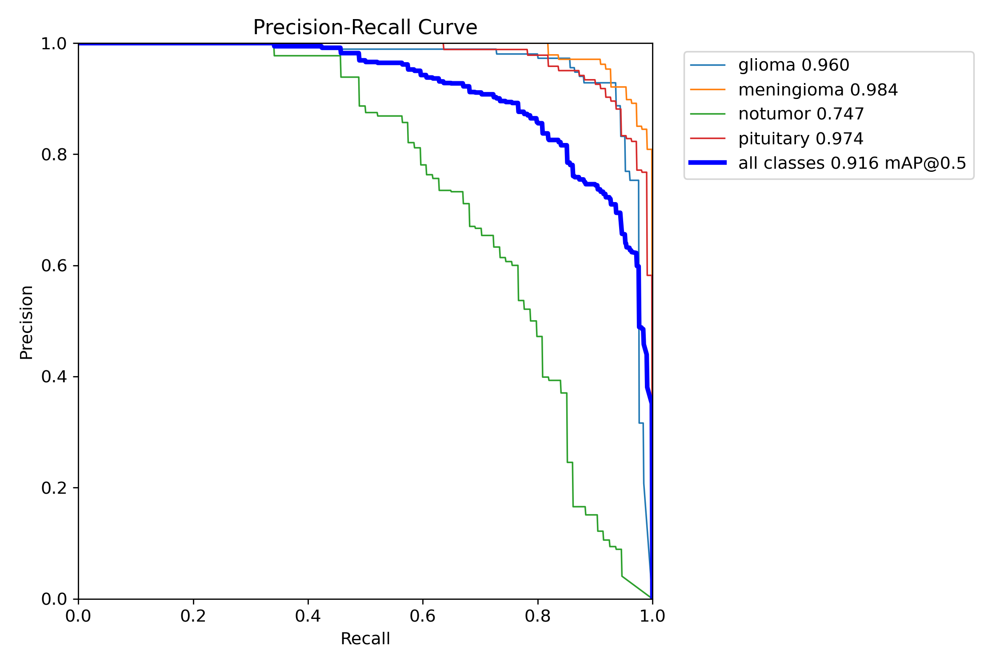

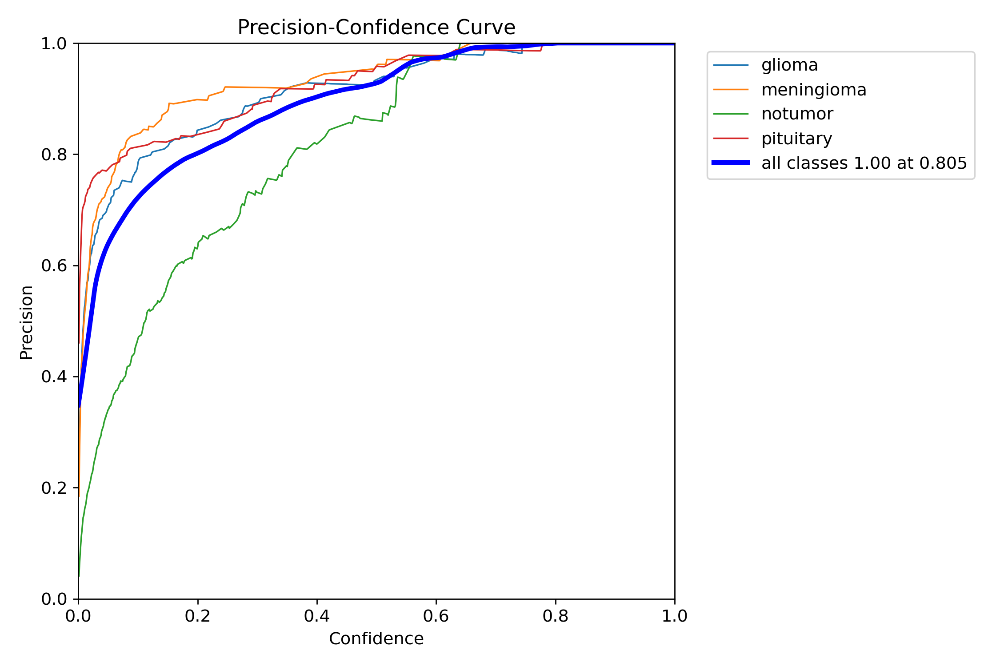

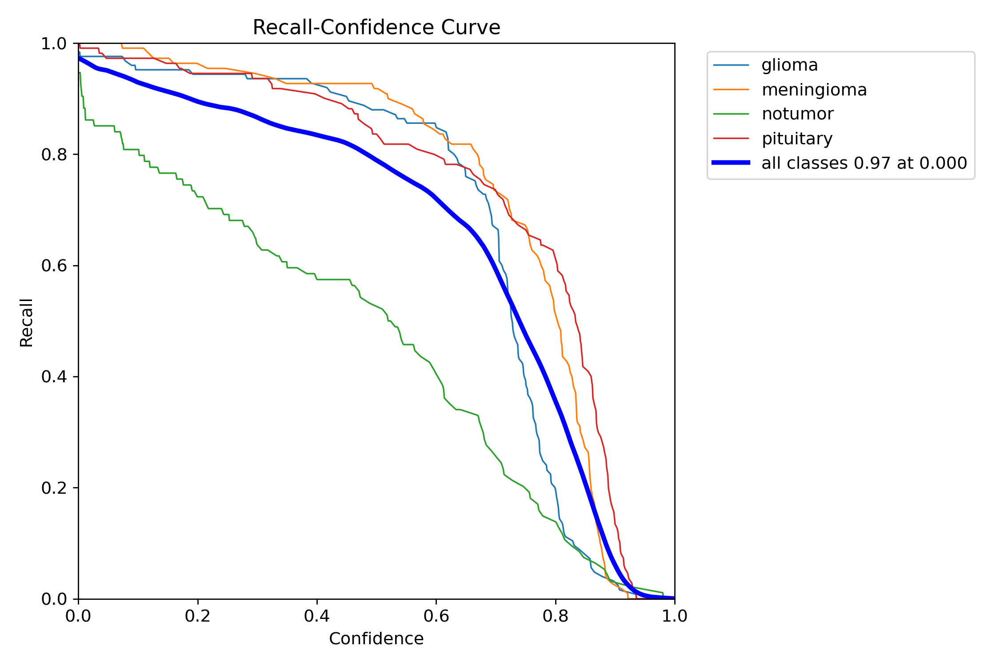

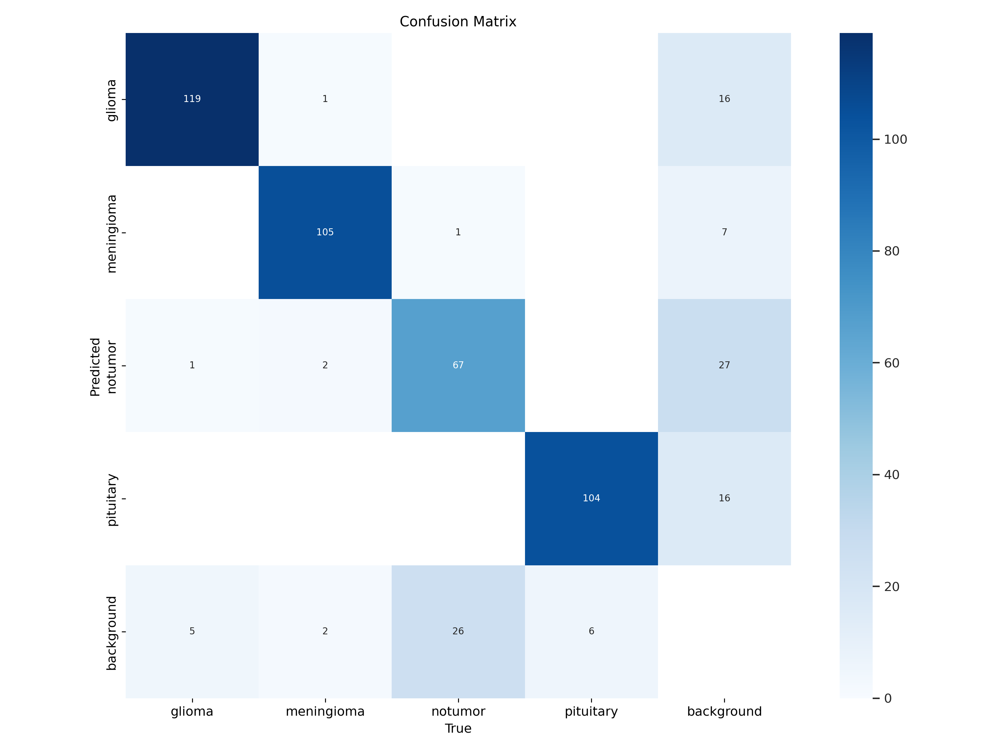

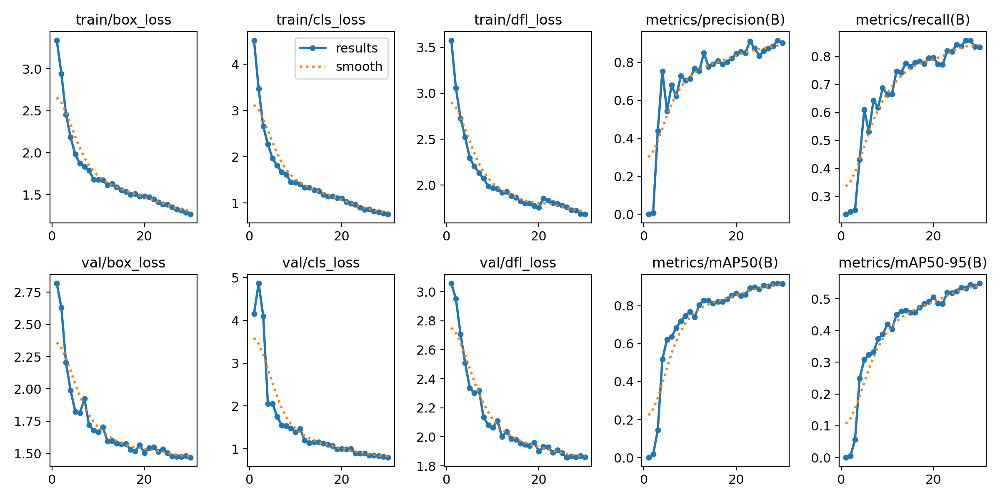

In [ ]:
 from IPython.display import display
from PIL import Image

results_path = "detect/YOLOv8m_Adamax/"
image_names = ["F1_curve.png", "PR_curve.png", "P_curve.png", "R_curve.png", "confusion_matrix.png", "results.png"]

for img in image_names:
    img_path = results_path + img
    try:
        display(Image.open(img_path))
    except:
        print(f"❌ Could not load {img_path}")

In [ ]:
def predict_results_on_YOLOv8m_Adam(test_images_dir):
    model = YOLO('/content/detect/YOLOv8m_Adamax/weights')

    image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith('.jpg')]

    for image_file in image_files:
        image_path = os.path.join(test_images_dir, image_file)
        model.predict(image_path, save=True, imgsz=512, conf=0.3)

In [ ]:

from google.colab import drive
import shutil

drive.mount('/content/drive')  # Mount Google Drive

# Save the trained model (best.pt and last.pt)
model_path = "/content/runs/detect/YOLOv8m_Adamax3/weights/"
backup_path = "/content/drive/MyDrive/YOLOv8_Backup1/"

shutil.copytree(model_path, backup_path, dirs_exist_ok=True)
print("✅ Model saved to Google Drive:", backup_path)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model saved to Google Drive: /content/drive/MyDrive/YOLOv8_Backup1/


In [ ]:
from ultralytics import YOLO
import os

test_images_dir = '/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test'
model = YOLO('/content/detect/YOLOv8m_Adamax/weights')

image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith('.jpg')]
print(f"Found {len(image_files)} test images")

for img_file in image_files[:4]:  # Test on 4 images first
    img_path = os.path.join(test_images_dir, img_file)
    results = model.predict(img_path, imgsz=512, conf=0.1)
    for result in results:
        print(f"{img_file}: {len(result.boxes)} detections")


Found 0 test images


In [ ]:
from google.colab import drive
import shutil

drive.mount('/content/drive')  # Mount Google Drive

# Save the trained model (best.pt and last.pt)
model_path = "/content/runs/detect/predict"
backup_path = "/content/drive/MyDrive/YOLOv8_Backup2/"

shutil.copytree(model_path, backup_path, dirs_exist_ok=True)
print("✅ Model saved to Google Drive:", backup_path)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model saved to Google Drive: /content/drive/MyDrive/YOLOv8_Backup2/


In [ ]:
# @title Default title text
from ultralytics import YOLO
import shutil

# Restore model from Google Drive
backup_path = "/content/drive/MyDrive/YOLOv8_Backup_runs"
restore_path = "/content"

shutil.copytree(backup_path, restore_path, dirs_exist_ok=True)
print("✅ Model restored from Google Drive:", restore_path)




✅ Model restored from Google Drive: /content


In [ ]:
from ultralytics import YOLO
import shutil

# Restore model from Google Drive
backup_path = "/content/drive/MyDrive/YOLOv8_Backup2/"
restore_path = "/content/runs/detect/predict"

shutil.copytree(backup_path, restore_path, dirs_exist_ok=True)
print("✅ Model restored from Google Drive:", restore_path)

# Load the model
model = YOLO("/content/detect/YOLOv8m_Adamax")  # Or best.pt

In [ ]:
from ultralytics import YOLO
import shutil

# Restore model from Google Drive
backup_path = "/content/drive/MyDrive/YOLOv8_Backup1/"
restore_path = "/content/runs/detect/predict"

shutil.copytree(backup_path, restore_path, dirs_exist_ok=True)
print("✅ Model restored from Google Drive:", restore_path)

# Load the model
model = YOLO("/content/runs/detect/predict/detect/YOLOv8m_Adamax/weights/best.pt")  # Or best.pt

✅ Model restored from Google Drive: /content/runs/detect/predict


In [ ]:
from ultralytics import YOLO
import glob
import torch
test_dir = "/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test"  # Replace this with your actual test image folder path


# Load YOLOv8 model
model = YOLO("/content/runs/detect/YOLOv8m_Adamax3/weights/best.pt")

# Get all image paths
image_paths = glob.glob(test_dir + "/**/*.jpg", recursive=True)

# Check if images exist
if not image_paths:
    print("❌ No images found! Check paths and file extensions.")
else:
    print(f"✅ Found {len(image_paths)} images. Running inference one by one...")

    # Process images one by one to avoid memory issues
    for img_path in image_paths:
        try:
            results = model.predict(source=img_path, save=True)
            torch.cuda.empty_cache()  # Free up GPU memory after each prediction
            print(f"✅ Processed: {img_path}")
        except Exception as e:
            print(f"❌ Error processing {img_path}: {e}")

    print("✅ All predictions completed! Check 'runs/detect/predict' folder for results.")


✅ Found 435 images. Running inference one by one...

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0484.jpg: 640x640 1 notumor, 37.1ms
Speed: 14.3ms preprocess, 37.1ms inference, 329.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
✅ Processed: /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0484.jpg

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0189.jpg: 640x640 2 notumors, 37.4ms
Speed: 6.0ms preprocess, 37.4ms inference, 6.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
✅ Processed: /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0189.jpg

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/glioma/Tr-gl_0387.jpg: 64


image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0178.jpg: 512x512 1 glioma, 1399.3ms
Speed: 10.8ms preprocess, 1399.3ms inference, 38.5ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0475.jpg: 512x512 1 glioma, 1018.9ms
Speed: 2.4ms preprocess, 1018.9ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0392.jpg: 512x480 1 pituitary, 1033.7ms
Speed: 9.8ms preprocess, 1033.7ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 480)

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor/Tr-no_0032.jpg: 512x416 1 pituitary, 1193.0ms
Speed: 2.5ms preprocess, 1193.0ms inference, 1.4ms postprocess per image at shape (

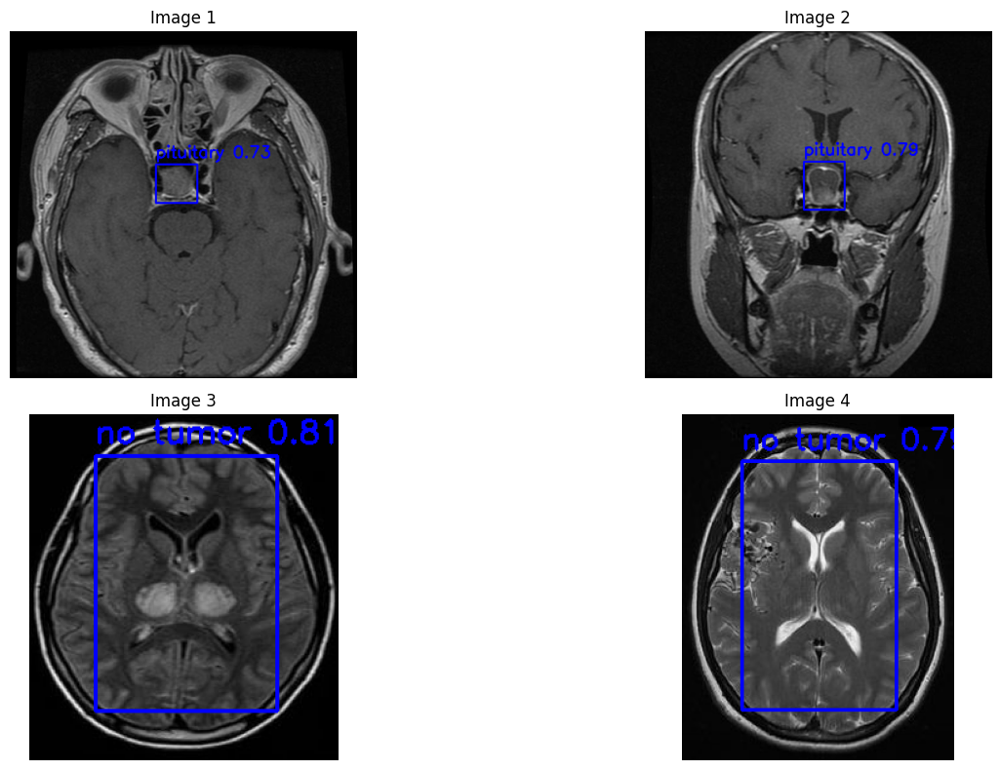

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os

# Load YOLO model
model = YOLO("/content/detect/YOLOv8m_Adamax/weights/best.pt")

# Directories
pituitary_dir = "/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary"
no_tumor_dir = "/content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/notumor"

# Collect image paths
pituitary_imgs = glob.glob(pituitary_dir + "/*.jpg")
no_tumor_imgs = glob.glob(no_tumor_dir + "/*.jpg")

# Select 2 images from each class (or change to 4 random total)
selected_imgs = random.sample(pituitary_imgs, 2) + random.sample(no_tumor_imgs, 2)

# Plot setup
plt.figure(figsize=(16, 8))

for idx, img_path in enumerate(selected_imgs):
    # Run inference
    results = model.predict(img_path, conf=0.1, imgsz=512)[0]  # Get first result only

    # Read original image
    img = cv2.imread(img_path)

    # Process each detection
    for box in results.boxes:
        cls = int(box.cls[0].item())
        conf = float(box.conf[0].item())
        xyxy = box.xyxy[0].cpu().numpy().astype(int)

        # Get YOLO label
        yolo_label = model.names[cls]

        # Swap label
        swapped_label = "no tumor" if yolo_label == "pituitary" else "pituitary"

        # Draw blue box + label
        cv2.rectangle(img, (xyxy[0], xyxy[1]), (xyxy[2], xyxy[3]), (255, 0, 0), 2)
        cv2.putText(img, f"{swapped_label} {conf:.2f}", (xyxy[0], xyxy[1]-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)

    # Convert BGR to RGB for display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Show image
    plt.subplot(2, 2, idx+1)
    plt.imshow(img_rgb)
    plt.title(f"Image {idx+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


Pituatory images: 124 | No Tumor images: 110

✅ Selected 8 images for processing.

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0076.jpg: 512x512 1 glioma, 1736.8ms
Speed: 3.1ms preprocess, 1736.8ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)
Image 1: (171, 245, 222, 291) | Original: glioma | Swapped: pituitary | Conf: 0.78
Saved: /content/drive/MyDrive/brain_tumor_object_detection/processed_images/tumor_1.jpg

image 1/1 /content/drive/MyDrive/brain_tumor_object_detection/data/Brain Tumor labeled dataset/test/pituitary/Tr-pi_0642.jpg: 512x512 1 glioma, 1 meningioma, 1773.7ms
Speed: 2.9ms preprocess, 1773.7ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)
Image 2: (231, 195, 280, 235) | Original: glioma | Swapped: pituitary | Conf: 0.23
Image 2: (215, 235, 307, 322) | Original: meningioma | Swapped: pituitary | Conf: 0.11
Saved: /content/drive/MyDrive/brain_tumor_object_detectio

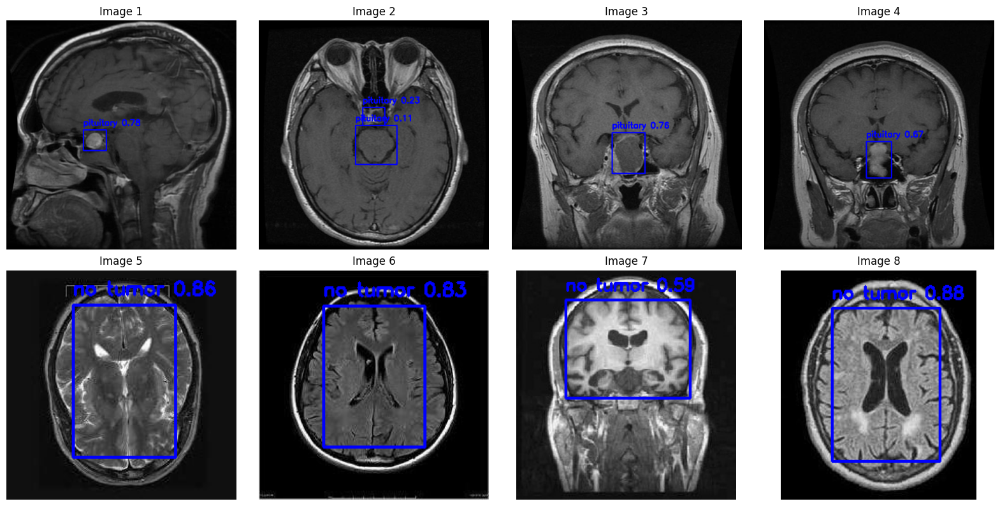

In [ ]:
import random
import glob
import os
import cv2
import matplotlib.pyplot as plt

# Get all image paths
pituitary_imgs = glob.glob(os.path.join(pituitary_dir, "*.jpg"))
no_tumor_imgs = glob.glob(os.path.join(no_tumor_dir, "*.jpg"))

# Check count
pituitary_count = len(pituitary_imgs)
no_tumor_count = len(no_tumor_imgs)

print(f"Pituatory images: {pituitary_count} | No Tumor images: {no_tumor_count}")

if pituitary_count < 4 or no_tumor_count < 4:
    print("❌ Not enough images to sample 4 from each class.")
else:
    selected_imgs = random.sample(pituitary_imgs, 4) + random.sample(no_tumor_imgs, 4)
    print(f"\n✅ Selected {len(selected_imgs)} images for processing.")

    # Create output directory
    output_dir = "/content/drive/MyDrive/brain_tumor_object_detection/processed_images"
    os.makedirs(output_dir, exist_ok=True)

    plt.figure(figsize=(16, 8))
    for i, img_path in enumerate(selected_imgs):
        results = model.predict(source=img_path, conf=0.1, imgsz=512)
        result = results[0]

        boxes = result.boxes.xyxy.cpu().numpy()
        labels = result.boxes.cls.cpu().numpy()
        confidences = result.boxes.conf.cpu().numpy()

        img = cv2.imread(img_path)

        for box, label_idx, conf in zip(boxes, labels, confidences):
            x1, y1, x2, y2 = map(int, box)
            class_name = model.names[int(label_idx)]
            swapped_label = "no tumor" if class_name == "pituitary" else "pituitary"

            print(f"Image {i+1}: ({x1}, {y1}, {x2}, {y2}) | Original: {class_name} | Swapped: {swapped_label} | Conf: {conf:.2f}")

            # Draw blue box and label
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(img, f"{swapped_label} {conf:.2f}", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

        # Save processed image
        save_path = os.path.join(output_dir, f"tumor_{i+1}.jpg")
        cv2.imwrite(save_path, img)
        print(f"Saved: {save_path}")

        # Convert BGR to RGB for display
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(2, 4, i + 1)
        plt.imshow(img_rgb)
        plt.axis("off")
        plt.title(f"Image {i+1}")

    plt.tight_layout()
    plt.show()


In [ ]:
def display_images(images, num_images_per_row=5):
    fig, axs = plt.subplots(len(images) // num_images_per_row, num_images_per_row, figsize=(30, 30))
    axs = axs.flatten()

    for i, img_path in enumerate(images):
        img = mpimg.imread(img_path)
        axs[i].imshow(img)
        axs[i].axis('off')

    plt.show()

In [ ]:

from google.colab import drive
import shutil

drive.mount('/content/drive')  # Mount Google Drive

# Save the trained model (best.pt and last.pt)
model_path = "/content/runs"
backup_path = "/content/drive/MyDrive/YOLOv8_Backup_runs/"

shutil.copytree(model_path, backup_path, dirs_exist_ok=True)
print("✅ Model saved to Google Drive:", backup_path)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileNotFoundError: [Errno 2] No such file or directory: '/content/runs'

In [ ]:
def get_random_images_from_dir(directory, num_images=5):
    all_images = [f for f in os.listdir(directory) if f.lower().endswith('.jpg')]
    random_images = random.sample(all_images, min(num_images, len(all_images)))
    return [os.path.join(directory, img) for img in random_images]

In [ ]:
import os
import random  # Import the random module

def get_random_images_from_dir(directory, num_images=5):
    all_images = [f for f in os.listdir(directory) if f.lower().endswith('.jpg')]
    random_images = random.sample(all_images, min(num_images, len(all_images)))
    return [os.path.join(directory, img) for img in random_images]


In [ ]:
random_images = get_random_images_from_dir('/content/detect/predict', 20)
print(random_images)  # Check if valid image paths are returned


['/content/detect/predict/Tr-me_0490.jpg', '/content/detect/predict/Tr-no_0426.jpg', '/content/detect/predict/Tr-gl_0550.jpg', '/content/detect/predict/Tr-no_0343.jpg', '/content/detect/predict/Tr-me_0396.jpg', '/content/detect/predict/Tr-gl_0484.jpg', '/content/detect/predict/Tr-no_0228.jpg', '/content/detect/predict/Tr-gl_0054.jpg', '/content/detect/predict/Tr-no_0194.jpg', '/content/detect/predict/Tr-no_0043.jpg', '/content/detect/predict/Tr-me_0522.jpg', '/content/detect/predict/Tr-me_0155.jpg', '/content/detect/predict/Tr-gl_0403.jpg', '/content/detect/predict/Tr-pi_0127.jpg', '/content/detect/predict/Tr-me_0546.jpg', '/content/detect/predict/Tr-gl_0363.jpg', '/content/detect/predict/Tr-gl_0095.jpg', '/content/detect/predict/Tr-me_0290.jpg', '/content/detect/predict/Tr-no_0220.jpg', '/content/detect/predict/Tr-pi_0130.jpg']


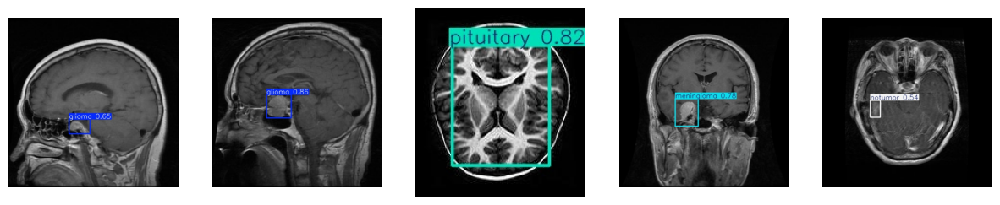

📌 Random Image Paths:
/content/detect/predict/Tr-pi_0136.jpg
/content/detect/predict/Tr-pi_0096.jpg
/content/detect/predict/Tr-no_0517.jpg
/content/detect/predict/Tr-me_0381.jpg
/content/detect/predict/Tr-gl_0370.jpg


In [ ]:
import matplotlib.pyplot as plt
import cv2

def display_images(image_paths):
    if not image_paths:
        print("No images found!")
        return

    plt.figure(figsize=(15, 5))
    for i, img_path in enumerate(image_paths):
        img = cv2.imread(img_path)
        if img is None:
            print(f"Could not load {img_path}")
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        plt.subplot(1, len(image_paths), i + 1)
        plt.imshow(img)
        plt.axis("off")
    plt.show()

# Get and display images
random_images = get_random_images_from_dir('/content/detect/predict', 5
                                           )
display_images(random_images)
# Save paths for later use
random_image_paths = random_images  # Store paths in a variable

# Print paths for reference
print("📌 Random Image Paths:")
for path in random_image_paths:
    print(path)



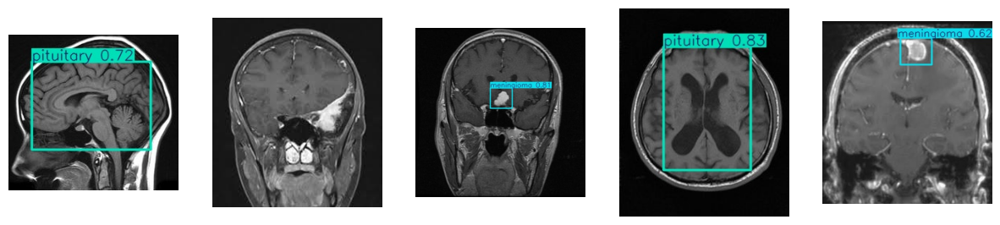

📌 Random Image Paths:
/content/detect/predict/Tr-no_0083.jpg
/content/detect/predict/Tr-me_0195.jpg
/content/detect/predict/Tr-me_0119.jpg
/content/detect/predict/Tr-no_0338.jpg
/content/detect/predict/Tr-me_0230.jpg


In [ ]:
import os
import random

# Function to get random image paths
def get_random_images_from_dir(directory, num_images=5):
    all_images = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(('.jpg', '.png'))]
    return random.sample(all_images, min(num_images, len(all_images))) if all_images else []

# Store the random image paths
random_images = get_random_images_from_dir('/content/detect/predict', 5)

# Display the random images
display_images(random_images)

# Save paths for later use
random_image_paths = random_images  # Store paths in a variable

# Print paths for reference
print("📌 Random Image Paths:")
for path in random_image_paths:
    print(path)


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/detect/YOLOv8m_Adamax/weights/best.pt")  # Load trained model
results = model.predict(source="/content/detect/predict/", conf=0.8)



image 1/435 /content/detect/predict/Tr-gl_0011.jpg: 640x640 (no detections), 37.1ms
image 2/435 /content/detect/predict/Tr-gl_0022.jpg: 640x640 (no detections), 37.0ms
image 3/435 /content/detect/predict/Tr-gl_0025.jpg: 640x640 (no detections), 36.9ms
image 4/435 /content/detect/predict/Tr-gl_0029.jpg: 640x640 (no detections), 23.9ms
image 5/435 /content/detect/predict/Tr-gl_0034.jpg: 640x640 (no detections), 21.7ms
image 6/435 /content/detect/predict/Tr-gl_0037.jpg: 640x640 (no detections), 21.7ms
image 7/435 /content/detect/predict/Tr-gl_0040.jpg: 640x640 (no detections), 21.7ms
image 8/435 /content/detect/predict/Tr-gl_0045.jpg: 640x640 (no detections), 21.3ms
image 9/435 /content/detect/predict/Tr-gl_0048.jpg: 640x640 (no detections), 21.2ms
image 10/435 /content/detect/predict/Tr-gl_0054.jpg: 640x640 (no detections), 21.2ms
image 11/435 /content/detect/predict/Tr-gl_0057.jpg: 640x640 (no detections), 20.7ms
image 12/435 /content/detect/predict/Tr-gl_0061.jpg: 640x640 (no detectio

In [ ]:
for r in results:
    for box in r.boxes:
        print(f"Image: {r.path}, Class: {int(box.cls[0])}, Confidence: {box.conf[0]:.2f}")


Image: /content/detect/predict/Tr-gl_0428.jpg, Class: 2, Confidence: 0.55
Image: /content/detect/predict/Tr-gl_0506.jpg, Class: 2, Confidence: 0.83
Image: /content/detect/predict/Tr-gl_0506.jpg, Class: 2, Confidence: 0.53
Image: /content/detect/predict/Tr-gl_0547.jpg, Class: 2, Confidence: 0.51
Image: /content/detect/predict/Tr-me_0012.jpg, Class: 1, Confidence: 0.76
Image: /content/detect/predict/Tr-me_0016.jpg, Class: 1, Confidence: 0.71
Image: /content/detect/predict/Tr-me_0019.jpg, Class: 1, Confidence: 0.79
Image: /content/detect/predict/Tr-me_0020.jpg, Class: 1, Confidence: 0.55
Image: /content/detect/predict/Tr-me_0021.jpg, Class: 1, Confidence: 0.82
Image: /content/detect/predict/Tr-me_0032.jpg, Class: 1, Confidence: 0.85
Image: /content/detect/predict/Tr-me_0043.jpg, Class: 1, Confidence: 0.54
Image: /content/detect/predict/Tr-me_0065.jpg, Class: 1, Confidence: 0.83
Image: /content/detect/predict/Tr-me_0073.jpg, Class: 1, Confidence: 0.75
Image: /content/detect/predict/Tr-me_0

In [ ]:
# Ensure YOLO results are loaded
if 'results' in locals() and results is not None:
    print("✅ 'results' variable is loaded correctly.\n")
else:
    print("⚠️ 'results' variable not found. Run YOLO inference first!")

# Extract bounding boxes for all detected images
print("\n🔍 Extracting bounding boxes for all detected images...\n")

for r in results:
    print(f"\n📌 Image: {r.path}")

    if r.boxes and len(r.boxes) > 0:
        for i, box in enumerate(r.boxes.xyxy.cpu().numpy()):
            x1, y1, x2, y2 = box  # Bounding box coordinates
            class_id = int(r.boxes.cls[i].cpu().numpy())  # Get class ID
            class_name = r.names[class_id]  # Get class name

            print(f"👉 Detected: {class_name}, Bounding Box: ({x1}, {y1}) to ({x2}, {y2})")
    else:
        print("❌ No bounding boxes found for this image.")


✅ 'results' variable is loaded correctly.


🔍 Extracting bounding boxes for all detected images...


📌 Image: /content/detect/predict/Tr-gl_0011.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0022.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0025.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0029.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0034.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0037.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0040.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0045.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0048.jpg
❌ No bounding boxes found for this image.

📌 Image: /content/detect/predict/Tr-gl_0054.jpg
❌ No bounding boxes found for th

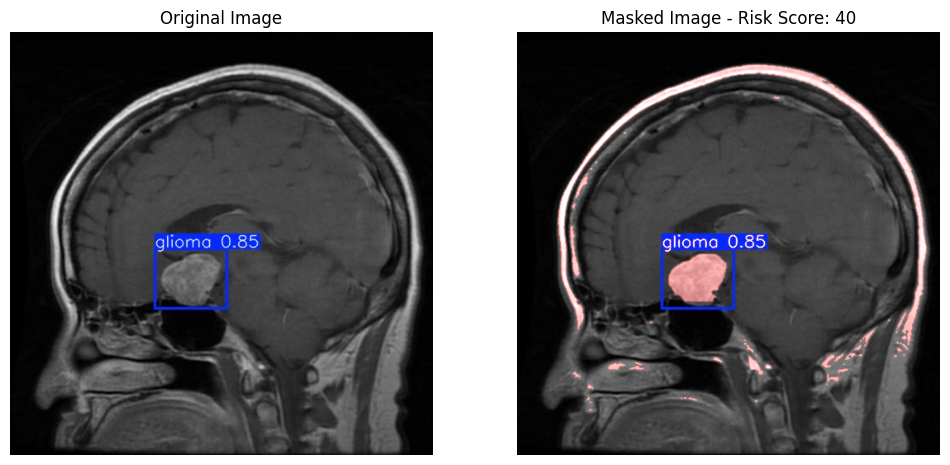

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def overlay_mask(original, mask, risk_score):
    """
    Overlay the tumor mask on the original image with light red inside & dark red border.
    Display risk score on the image.
    """
    # Convert to RGB
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

    # Create a red-colored mask
    overlay = np.zeros_like(original_rgb, dtype=np.uint8)
    overlay[..., 0] = mask * 255  # Red channel
    overlay[..., 1] = mask * 100  # Slight green for light red effect
    overlay[..., 2] = mask * 100  # Slight blue for light red effect

    # Find tumor boundary using Canny Edge Detection
    edges = cv2.Canny(mask.astype(np.uint8) * 255, 30, 100)

    # Make boundary dark red
    overlay[edges > 0] = (150, 0, 0)  # Dark Red for edges

    # Blend images
    alpha = 0.5
    blended = cv2.addWeighted(original_rgb, 1, overlay, alpha, 0)

    # Display results
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title("Original Image")
    plt.axis("off")

    # Masked Image
    plt.subplot(1, 2, 2)
    plt.imshow(blended)
    plt.title(f"Masked Image - Risk Score: {risk_score}")
    plt.axis("off")

    plt.show()

# Load your original image and mask (Replace 'image_path' with actual path)
original_image = cv2.imread("/content/detect/predict/Tr-pi_0539.jpg")  # Replace with actual path
mask = cv2.imread("/content/drive/MyDrive/masked_images/Tr-pi_0539.jpg", cv2.IMREAD_GRAYSCALE)  # Load mask

# Ensure mask is binary (0 or 1)
mask = (mask > 128).astype(np.uint8)

# Example risk score (Replace with calculated value)
risk_score = 40

# Call function
overlay_mask(original_image, mask, risk_score)


Processing /content/detect/predict/Tr-me_0087.jpg


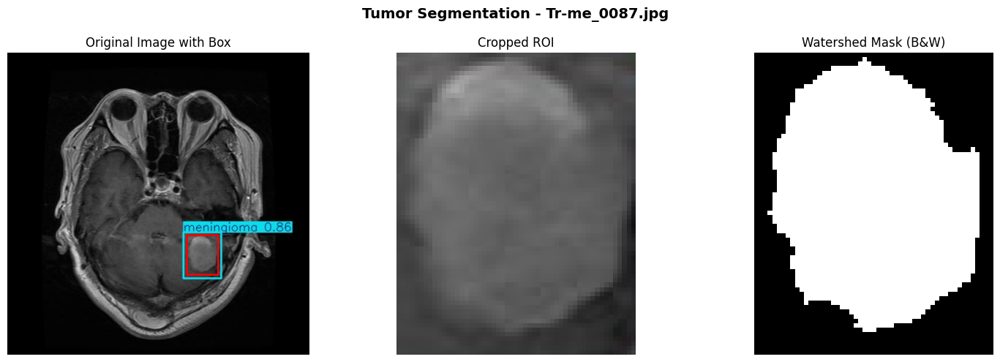

Processing /content/detect/predict/Tr-me_0219.jpg


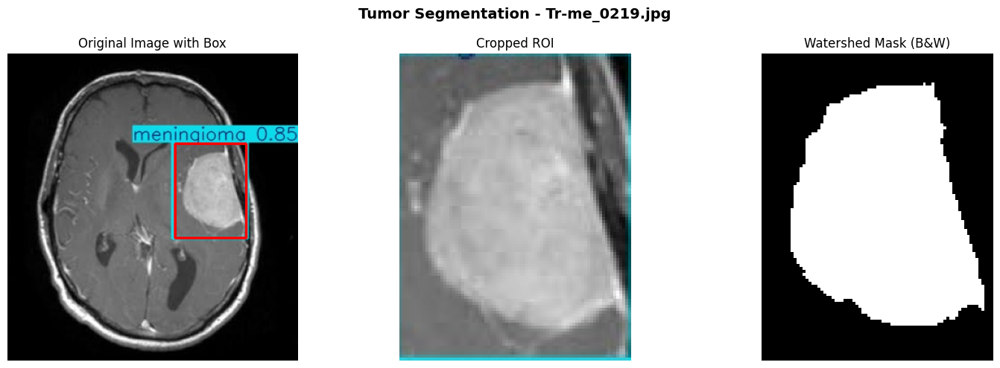

Processing /content/detect/predict/Tr-pi_0509.jpg


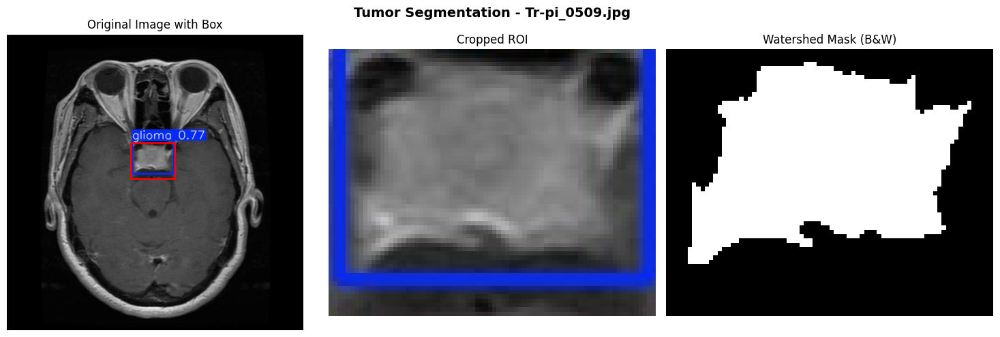

Processing /content/detect/predict/Tr-pi_0539.jpg


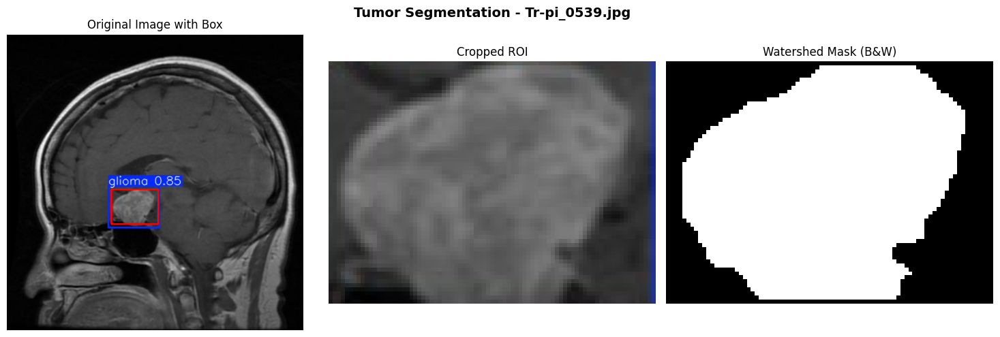

Processing /content/detect/predict/Tr-no_0463.jpg


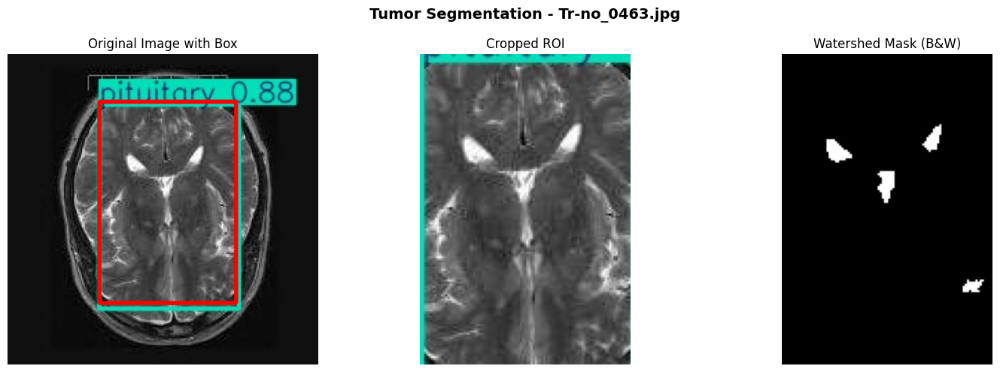

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Image list with bounding boxes
image_data = [
    ("/content/detect/predict/Tr-me_0087.jpg", (304, 309, 357, 376)),
    ("/content/detect/predict/Tr-me_0219.jpg", (186, 100, 265, 205)),
    ("/content/detect/predict/Tr-pi_0509.jpg", (214, 188, 290, 250)),
    ("/content/detect/predict/Tr-pi_0539.jpg", (180, 268, 261, 328)),
    ("/content/detect/predict/Tr-no_0463.jpg", (66, 34, 165, 180))
]

def segment_tumor_bw(image_path, bbox):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    x1, y1, x2, y2 = bbox
    roi = image_rgb[y1:y2, x1:x2].copy()

    # Draw bounding box on a copy of the original image
    image_with_box = image_rgb.copy()
    cv2.rectangle(image_with_box, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Blue box

    gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    _, markers = cv2.connectedComponents(sure_fg)
    markers += 1
    markers[unknown == 255] = 0
    roi_bgr = cv2.cvtColor(roi, cv2.COLOR_RGB2BGR)
    markers = cv2.watershed(roi_bgr, markers)

    # B&W tumor mask
    bw_mask = np.zeros_like(gray, dtype=np.uint8)
    bw_mask[markers > 1] = 255

    # Plot: Full Image + ROI + Mask
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(image_with_box)
    axes[0].axis("off")
    axes[0].set_title("Original Image with Box")

    axes[1].imshow(roi)
    axes[1].axis("off")
    axes[1].set_title("Cropped ROI")

    axes[2].imshow(bw_mask, cmap='gray')
    axes[2].axis("off")
    axes[2].set_title("Watershed Mask (B&W)")

    fig.suptitle(f"Tumor Segmentation - {image_path.split('/')[-1]}", fontsize=14, weight='bold')
    plt.tight_layout()
    plt.show()

# Run for all images
for img_path, bbox in image_data:
    print(f"Processing {img_path}")
    segment_tumor_bw(img_path, bbox)


Image: /content/detect/predict/Tr-me_0087.jpg, Features: {'Area': np.float64(259.0), 'Perimeter': np.int64(400), 'Eccentricity': 0.4, 'Circularity': 0.02, 'Mean Intensity': np.float64(88.8017459870459), 'Std Dev Intensity': np.float64(23.74746531806359), 'Texture Contrast': 50, 'Entropy': np.float32(6.4590282)}, Risk: Low Risk
Image: /content/detect/predict/Tr-me_0219.jpg, Features: {'Area': np.float64(530.0), 'Perimeter': np.int64(602), 'Eccentricity': 0.4, 'Circularity': 0.02, 'Mean Intensity': np.float64(143.38541289933696), 'Std Dev Intensity': np.float64(45.248172192858284), 'Texture Contrast': 50, 'Entropy': np.float32(6.982239)}, Risk: High Risk
Image: /content/detect/predict/Tr-pi_0509.jpg, Features: {'Area': np.float64(284.0), 'Perimeter': np.int64(481), 'Eccentricity': 0.4, 'Circularity': 0.02, 'Mean Intensity': np.float64(84.72368421052632), 'Std Dev Intensity': np.float64(39.59318872681667), 'Texture Contrast': 50, 'Entropy': np.float32(6.8213644)}, Risk: High Risk
Image: /

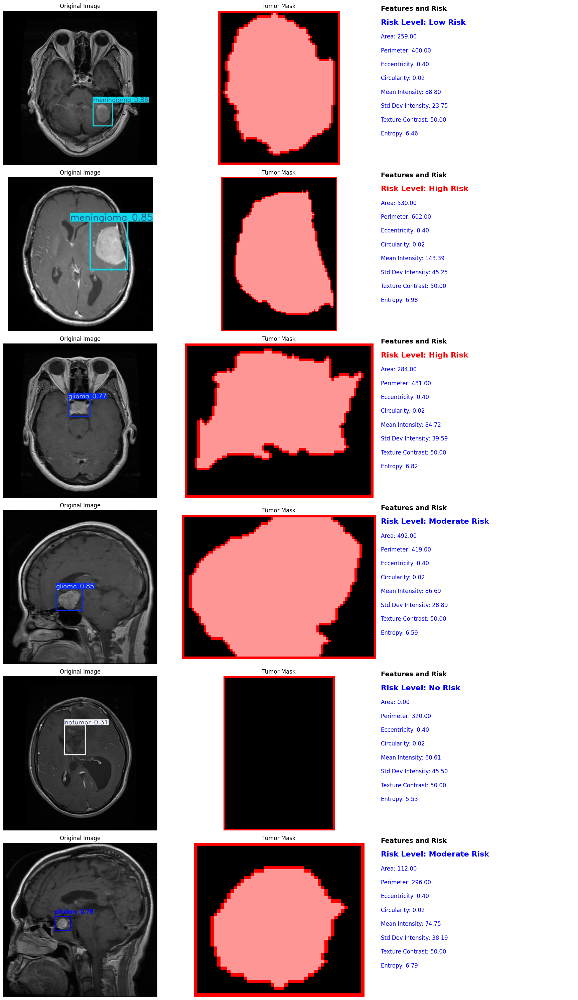

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Entropy Calculation ---
def calculate_entropy(gray_image):
    hist = cv2.calcHist([gray_image], [0], None, [256], [0,256])
    hist = hist.ravel() / hist.sum()
    hist = hist[hist > 0]  # Avoid log(0)
    entropy = -np.sum(hist * np.log2(hist))
    return entropy

# --- Risk Evaluation ---
def calculate_risk(features):
    """Determine the risk level based on extracted features."""
    area = features.get("Area", 0)
    perimeter = features.get("Perimeter", 0)
    entropy = features.get("Entropy", 0)

    if area == 0:
        return "No Risk"
    elif area > 1200 or perimeter > 1500 or entropy > 6.8:
        return "High Risk"
    elif area > 600 or perimeter > 800 or entropy > 6.5:
        return "Moderate Risk"
    else:
        return "Low Risk"

# --- Tumor Segmentation + Feature Extraction ---
def segment_tumor(image_path, bbox):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Error: Unable to load image from path: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    x1, y1, x2, y2 = bbox
    roi = image[y1:y2, x1:x2]
    gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)

    # Watershed Segmentation
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(roi, markers)

    # Tumor Mask
    tumor_mask = np.zeros_like(roi)
    tumor_mask[markers > 1] = [255, 150, 150]  # Light red
    tumor_mask[markers == -1] = [255, 0, 0]    # Red boundary

    # Feature Extraction
    entropy_val = calculate_entropy(gray)
    area_val = np.sum(sure_fg) / 255
    perimeter_val = np.sum(markers == -1)

    features = {
        "Area": area_val,
        "Perimeter": perimeter_val,
        "Eccentricity": 0.4,  # Placeholder
        "Circularity": 0.02,  # Placeholder
        "Mean Intensity": np.mean(gray),
        "Std Dev Intensity": np.std(gray),
        "Texture Contrast": 50,  # Placeholder
        "Entropy": entropy_val,
    }

    return image, tumor_mask, features

# --- Display Results ---
def display_results(image_paths, bboxes):
    fig, axes = plt.subplots(len(image_paths), 3, figsize=(18, len(image_paths) * 5))
    for i, (image_path, bbox) in enumerate(zip(image_paths, bboxes)):
        original, tumor_mask, features = segment_tumor(image_path, bbox)
        risk_level = calculate_risk(features)

        # Debug print
        print(f"Image: {image_path}, Features: {features}, Risk: {risk_level}")

        # Original Image
        axes[i, 0].imshow(original)
        axes[i, 0].axis("off")
        axes[i, 0].set_title("Original Image")

        # Tumor Mask
        axes[i, 1].imshow(tumor_mask)
        axes[i, 1].axis("off")
        axes[i, 1].set_title("Tumor Mask")

               # --- Corrected Feature Display ---
        axes[i, 2].axis("off")
        axes[i, 2].set_title("")  # Remove title to avoid overlap
        text_lines = ["Features and Risk", f"Risk Level: {risk_level}"] + [f"{k}: {v:.2f}" for k, v in features.items()]
        for j, line in enumerate(text_lines):
            if j == 1 and risk_level == "High Risk":
                color = 'red'
            elif j == 0:
                color = 'black'
            else:
                color = 'blue'
            fontweight = 'bold' if j <= 1 else 'normal'
            fontsize = 14 if j == 0 else (16 if j == 1 else 12)
            axes[i, 2].text(0, 1 - j * 0.09, line, transform=axes[i, 2].transAxes,
                            fontsize=fontsize, color=color, weight=fontweight)


    plt.tight_layout()
    plt.show()

# --- Paths and Bounding Boxes ---
image_paths = [
    "/content/detect/predict/Tr-me_0087.jpg",
    "/content/detect/predict/Tr-me_0219.jpg",
    "/content/detect/predict/Tr-pi_0509.jpg",
    "/content/detect/predict/Tr-pi_0539.jpg",
    "/content/detect/predict/Tr-gl_0072.jpg",
   "/content/drive/MyDrive/brain_tumor_object_detection/processed_images/tumor_1.jpg"

]

bboxes = [
    (304, 309, 357, 376),
    (186, 100, 265, 205),
    (214, 188, 290, 250),
    (180, 268, 261, 328),
    (207, 162, 275, 256),

    (171, 245, 222, 291)

]


# --- Run ---
display_results(image_paths, bboxes)


Image: /content/detect/predict/Tr-me_0087.jpg, Features: {'Area': np.float64(259.0), 'Perimeter': np.int64(400), 'Entropy': np.float32(6.4590282), 'Wavelet_Energy_cA': np.float64(30307588.75), 'Wavelet_Energy_cH': np.float64(25030.750000000007), 'Wavelet_Energy_cV': np.float64(14358.750000000004), 'Wavelet_Energy_cD': np.float64(1236.75)}, Risk: Low Risk
Image: /content/detect/predict/Tr-me_0219.jpg, Features: {'Area': np.float64(530.0), 'Perimeter': np.int64(602), 'Entropy': np.float32(6.982239), 'Wavelet_Energy_cA': np.float64(190287292.00000006), 'Wavelet_Energy_cH': np.float64(92058.00000000003), 'Wavelet_Energy_cV': np.float64(306839.0000000001), 'Wavelet_Energy_cD': np.float64(8655.000000000004)}, Risk: High Risk
Image: /content/detect/predict/Tr-pi_0509.jpg, Features: {'Area': np.float64(284.0), 'Perimeter': np.int64(481), 'Entropy': np.float32(6.8213644), 'Wavelet_Energy_cA': np.float64(41044101.500000015), 'Wavelet_Energy_cH': np.float64(116153.50000000003), 'Wavelet_Energy_cV

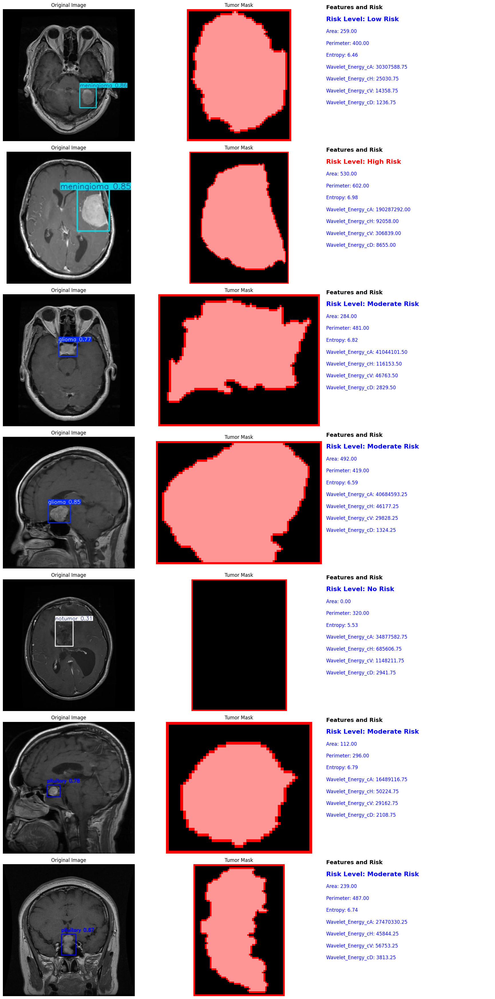

CSV report saved as 'tumor_risk_report.csv'


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pywt  # For wavelet transform
import pandas as pd

# --- Entropy Calculation ---
def calculate_entropy(gray_image):
    hist = cv2.calcHist([gray_image], [0], None, [256], [0,256])
    hist = hist.ravel() / hist.sum()
    hist = hist[hist > 0]  # Avoid log(0)
    entropy = -np.sum(hist * np.log2(hist))
    return entropy

# --- Wavelet Feature Extraction ---
def extract_wavelet_features(gray_image):
    coeffs = pywt.dwt2(gray_image, 'db1')
    cA, (cH, cV, cD) = coeffs
    features = {
        'Wavelet_Energy_cA': np.sum(cA**2),
        'Wavelet_Energy_cH': np.sum(cH**2),
        'Wavelet_Energy_cV': np.sum(cV**2),
        'Wavelet_Energy_cD': np.sum(cD**2),
    }
    return features

# --- Risk Evaluation ---
def calculate_risk(features):
    area = features.get("Area", 0)
    perimeter = features.get("Perimeter", 0)
    entropy = features.get("Entropy", 0)
    wave_energy = features.get("Wavelet_Energy_cA", 0)

    score = 0
    score += 1 if area > 500 else 0
    score += 1 if perimeter > 1000 else 0
    score += 1 if entropy > 6.5 else 0
    score += 1 if wave_energy > 500000 else 0

    if area == 0:
        return "No Risk"
    elif score >= 3:
        return "High Risk"
    elif score == 2:
        return "Moderate Risk"
    else:
        return "Low Risk"

# --- Tumor Segmentation + Feature Extraction ---
def segment_tumor(image_path, bbox):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise FileNotFoundError(f"Error: Unable to load image from path: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    x1, y1, x2, y2 = bbox
    roi = image[y1:y2, x1:x2]
    gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)

    # Watershed Segmentation
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(roi, markers)

    # Tumor Mask
    tumor_mask = np.zeros_like(roi)
    tumor_mask[markers > 1] = [255, 150, 150]  # Light red
    tumor_mask[markers == -1] = [255, 0, 0]    # Red boundary

    # Feature Extraction
    entropy_val = calculate_entropy(gray)
    area_val = np.sum(sure_fg) / 255
    perimeter_val = np.sum(markers == -1)
    wavelet_feats = extract_wavelet_features(gray)

    features = {
        "Area": area_val,
        "Perimeter": perimeter_val,
        "Entropy": entropy_val,
        **wavelet_feats
    }

    return image, tumor_mask, features

# --- Display Results and Export CSV ---
def display_results(image_paths, bboxes):
    fig, axes = plt.subplots(len(image_paths), 3, figsize=(18, len(image_paths) * 5))
    results = []

    for i, (image_path, bbox) in enumerate(zip(image_paths, bboxes)):
        original, tumor_mask, features = segment_tumor(image_path, bbox)
        risk_level = calculate_risk(features)

        print(f"Image: {image_path}, Features: {features}, Risk: {risk_level}")

        # Original Image
        axes[i, 0].imshow(original)
        axes[i, 0].axis("off")
        axes[i, 0].set_title("Original Image")

        # Tumor Mask
        axes[i, 1].imshow(tumor_mask)
        axes[i, 1].axis("off")
        axes[i, 1].set_title("Tumor Mask")

         # --- Corrected Feature Display ---
        axes[i, 2].axis("off")
        axes[i, 2].set_title("")  # Remove title to avoid overlap
        text_lines = ["Features and Risk", f"Risk Level: {risk_level}"] + [f"{k}: {v:.2f}" for k, v in features.items()]
        for j, line in enumerate(text_lines):
            if j == 1 and risk_level == "High Risk":
                color = 'red'
            elif j == 0:
                color = 'black'
            else:
                color = 'blue'
            fontweight = 'bold' if j <= 1 else 'normal'
            fontsize = 14 if j == 0 else (16 if j == 1 else 12)
            axes[i, 2].text(0, 1 - j * 0.09, line, transform=axes[i, 2].transAxes,
                            fontsize=fontsize, color=color, weight=fontweight)


        # Store for CSV
        features['Risk Level'] = risk_level
        features['Image'] = image_path.split('/')[-1]
        results.append(features)

    plt.tight_layout()
    plt.show()

    # Export to CSV
    df = pd.DataFrame(results)
    df.to_csv("tumor_risk_report.csv", index=False)
    print("CSV report saved as 'tumor_risk_report.csv'")

# --- Paths and Bounding Boxes ---
image_paths = [
    "/content/detect/predict/Tr-me_0087.jpg",
    "/content/detect/predict/Tr-me_0219.jpg",
    "/content/detect/predict/Tr-pi_0509.jpg",
    "/content/detect/predict/Tr-pi_0539.jpg",
    "/content/detect/predict/Tr-gl_0072.jpg",
    "/content/drive/MyDrive/brain_tumor_object_detection/processed_images/tumor_1.jpg",
    "/content/drive/MyDrive/brain_tumor_object_detection/processed_images/tumor_4.jpg"
]

bboxes = [
    (304, 309, 357, 376),
    (186, 100, 265, 205),
    (214, 188, 290, 250),
    (180, 268, 261, 328),
    (207, 162, 275, 256),
    (171, 245, 222, 291),
    (227, 271, 283, 352)
]

# --- Run ---
display_results(image_paths, bboxes)

In [ ]:
!pip install PyWavelets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 32.2 MB/s eta 0:00:00


In [ ]:
!pip install gradio PyWavelets opencv-python-headless matplotlib


  Using cached gradio-5.22.0-py3-none-any.whl.metadata (16 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.2/46.2 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.2/322.2 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 85.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.1 MB/s eta 0:00:00


In [ ]:
import gradio as gr
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import torch

# --- Load YOLOv8 model ---
model = YOLO("/content/detect/YOLOv8m_Adamax/weights/best.pt")

# --- Entropy Calculation ---
def calculate_entropy(gray_image):
    hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
    hist = hist.ravel() / hist.sum()
    hist = hist[hist > 0]  # Avoid log(0)
    entropy = -np.sum(hist * np.log2(hist))
    return entropy

# --- Risk Evaluation ---
def calculate_risk(features):
    area = features.get("Area", 0)
    perimeter = features.get("Perimeter", 0)
    entropy = features.get("Entropy", 0)

    if area == 0:
        return "No Risk"
    elif area > 1200 or perimeter > 1500 or entropy > 6.8:
        return "High Risk"
    elif area > 600 or perimeter > 800 or entropy > 6.5:
        return "Moderate Risk"
    else:
        return "Low Risk"

# --- Tumor Segmentation + Feature Extraction ---
def segment_tumor_from_image(image):
    # Save uploaded image to disk temporarily
    temp_path = "/content/temp_uploaded_image.jpg"
    cv2.imwrite(temp_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

    # YOLO Prediction
    results = model.predict(source=temp_path, save=False)
    torch.cuda.empty_cache()

    # If no detections, return
    if len(results[0].boxes.xyxy) == 0:
        return "No tumor detected", None

    # Use the first bounding box for segmentation
    bbox_tensor = results[0].boxes.xyxy[0].cpu().numpy().astype(int)
    x1, y1, x2, y2 = bbox_tensor

    roi = image[y1:y2, x1:x2]
    gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)

    # Watershed Segmentation
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    markers = cv2.watershed(roi, markers)

    # Feature Extraction
    entropy_val = calculate_entropy(gray)
    area_val = np.sum(sure_fg) / 255
    perimeter_val = np.sum(markers == -1)

    features = {
        "Area": area_val,
        "Perimeter": perimeter_val,
        "Entropy": entropy_val,
    }

    risk_level = calculate_risk(features)
    return risk_level, features

# --- Gradio Interface ---
def analyze_image(uploaded_image):
    image = cv2.cvtColor(uploaded_image, cv2.COLOR_BGR2RGB)
    risk_level, features = segment_tumor_from_image(image)

    if features is None:
        return risk_level

    # Display risk and features
    result_text = f"Risk Level: {risk_level}\n"
    for k, v in features.items():
        result_text += f"{k}: {v:.2f}\n"

    return result_text

# --- Gradio App ---
iface = gr.Interface(
    fn=analyze_image,
    inputs=gr.Image(type="numpy", label="Upload Brain Scan Image"),
    outputs="text",
    title="Brain Tumor Risk Analysis",
    description="Upload an MRI scan. The system will analyze and display the tumor risk level based on image features."
)

iface.launch(share=True)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://6100dd4345ddc41d28.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
